# Imports

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as anim
import re
import folium
from matplotlib.animation import FuncAnimation
import bar_chart_race as bcr

from IPython.display import HTML

In [12]:
df_cities = pd.read_csv('cities.csv')
df_lines = pd.read_csv('lines.csv')
df_stations_lines = pd.read_csv('station_lines.csv')
df_systems = pd.read_csv('systems.csv')
df_stations = pd.read_csv('stations.csv')
df_track_lines = pd.read_csv('track_lines.csv')
df_tracks = pd.read_csv('tracks.csv')

# Helper Functions

In [13]:
def city_filter(city_name, df_cities):
    city_filter = set()
    if city_name == None:
        for name in df_cities['name'].values:
            city_filter.add(name)
    else:
        city_filter.add(city_name)
    return city_filter

def country_filter(country, df_cities):
    country_filter = set()
    if country == None:
        for countries in df_cities['country'].values:
            country_filter.add(countries)
    else:
        country_filter.add(country)
    return country_filter

def filter_cities(df_cities, year, city_name=None, country=None):  
    return df_cities[(df_cities['start_year']<=float(year)) 
             & (df_cities['name'].isin(city_filter(city_name, df_cities))==True) 
             & (df_cities['country'].isin(country_filter(country, df_cities))==True)]

# Clean columns for coordinates - Used for any column. 
def clean_columns(df, column, between):
    try:
        df.drop(df[df[column]=='LINESTRING Z EMPTY'].index, inplace=True)
        df[column] = df[column].map(lambda x: x.lstrip(between).rstrip(')'))
        return df
    except:
        df[column] = df[column].map(lambda x: x.lstrip(between).rstrip(')'))
        return df

def city_names(df_cities_clean):
    city_names_list = []
    city_names = df_cities_clean['name'].values
    
     # Get and clean list of city names.
    for row in range(len(df_cities_clean)):
        city_names_list.append(df_cities_clean['name'].values[row])
        city_names = [df_cities_clean.split(',') for df_cities_clean in city_names_list]
    return city_names

def city_coor(df_cities_clean):
    coor_list = []
    for row in range(len(df_cities_clean)):
        # Get and clean list of city coordinates.
        coor_list.append(df_cities_clean['coords'].values[row])
        coor_split = [df_cities_clean.split(' ') for df_cities_clean in coor_list]
        city_coordinates = [item[::-1] for item in coor_split]
    return city_coordinates

#This will be used to get tracks and stations. 
def city_ids(df_cities_clean):
    city_id_list = []
    city_id = df_cities_clean['id'].values
    # Get and clean list of city ids. 
    for row in range(len(df_cities_clean)):
        city_id_list.append(df_cities_clean['id'].values[row])
    return city_id

#Takes output from city_ids.
def filter_tracks(city_ids, df_tracks):
    city_keys = city_ids
    tracks = df_tracks[df_tracks['city_id'].isin(city_keys)==True]
    return tracks

def track_grouped(tracks):
    return tracks.groupby('city_id').sum()

def create_full_df(df_cities_clean, get_building_tracks, get_completed_tracks):
    city_df = df_cities_clean.rename(columns={'id':'city_id'})
    completed = track_grouped(get_completed_tracks)
    building = track_grouped(get_building_tracks)
    
    
    first_merge = city_df.merge(completed, how='left', on='city_id')
    first_merge_clean = first_merge[['city_id', 'name', 'country', 'length']]
    first_merge_clean = first_merge_clean.rename(columns={'length':'Total Length'})
    
    
    add_building = building['length']
    df_full = first_merge_clean.merge(add_building, how='left', on='city_id')
    df_full = df_full.drop(labels='city_id', axis = 1)
    df_full = df_full.rename(columns={'length':'Under Construction'})
    df_full = df_full.dropna(subset = ['Total Length','Under Construction'], how='all')
    df_full = df_full.fillna(0)
    return df_full

def bar_chart_city(df_full, year):
    df = df_full.drop(labels='country', axis = 1)
    df = df.set_index('name')
    ax = df.plot(kind='barh', figsize = (18,18), stacked=True, title=f'Total Track Length for {year}',
           fontsize = 13)
    ax.set_xlabel('Total Length (km)')
    ax.set_ylabel('Cities')
    
    return plt.show()
    
def bar_chart_country(df_full, year):
    df = df_full.drop(labels='name', axis = 1).groupby('country').sum()
    ax = df.plot(kind='barh', figsize = (18,18), stacked=True, 
            title=f'Total Track Length for {year}',
           fontsize = 13)
    ax.set_xlabel('Total Length (km)')
    ax.set_ylabel('Countries')
    
    return plt.show()  
    
def get_building_tracks(tracks, year):
    return tracks[(tracks['buildstart'] <= year) 
                & (tracks['buildstart'] != 0)
                  & (tracks['opening'] > year)]

def get_completed_tracks(tracks, year):
    return tracks[(tracks['buildstart'] < year) 
                  & (tracks['opening'] < year)
                 & (tracks['closure'] > year)]

def get_track_coor(tracks):
    # Extracts coordinates from filter_tracks.
    track_list = []
    for row in range(len(tracks)):
        list_of_coor = [x.replace(' ', ', ') for x in tracks['geometry'].values[row].split(',')]
            # Split each coordinate so we can turn it into a float.
        split = [i.split(',') for i in list_of_coor]
        split_reverse = [item[::-1] for item in split]
        int_split = [tuple(map(float, k)) for k in split_reverse]
        track_list.append(int_split) 
    return track_list

def plot(track_build_coor, tracks_done_coor, city_names, city_coor):
    # Load map centred on average coordinates
    ave_lat = sum(p[0][0] for p in tracks_done_coor)/len(tracks_done_coor)
    ave_lon = sum(p[1][1] for p in tracks_done_coor)/len(tracks_done_coor)
    #This m can be put as a class somewhere else. 
    m = folium.Map(location=[ave_lat, ave_lon], zoom_start=9)
    #Plot cities and their names
    for i in range(len(city_names)):
        folium.Circle(
            radius= 2500,
            location= city_coor[i],
            popup= city_names[i][0],
            color='crimson',
            fill=False,
        ).add_to(m)
    # Tracks being built coordinates.
    for build_coors in track_build_coor:
        folium.PolyLine(build_coors, color='blue', weight = 2.5, opacity=1).add_to(m)
    #Tracks already built coordinates.
    for complete_coors in tracks_done_coor:
        folium.PolyLine(complete_coors, color='green', weight = 2.5, opacity=1).add_to(m)
    return m

def create_df(test_file_cleaned, tracks_building, tracks_done, year, city=True, length=True):
    df = create_full_df(test_file_cleaned, tracks_building, tracks_done)
    #Want only cities.
    if city:
        df = df.drop(labels='country', axis = 1).set_index('name').sort_index().transpose()
        df['year'] = year
        df_length = df.iloc[[0]]
        df_build = df.iloc[[1]]
        if length:
            return df_length
        else:
            return df_build
    #Want only countries.
    else:
        df = df.drop(labels='name', axis = 1).groupby('country').sum().transpose()
        df['year'] = year
        df_length = df.iloc[[0]]
        df_build = df.iloc[[1]]
        if length:
            return df_length
        else:
            return df_build

# Functions

In [14]:
def create_time_series(df_cities, df_tracks, end_year, start_year=None, city_name=None, city=True, length=True):
    cities = ['Angers', 'Barcelona', 'Beijing', 'Berlin', 'Besancon', 'Bilbao',
       'Bogotá', 'Bordeaux', 'Boston', 'Brest', 'Budapest', 'Buenos Aires',
       'Caracas', 'Chicago', 'Cincinnati', 'Clermont-Ferrand', 'Concepción',
       'Dallas', 'Dijon', 'Edinburgh', 'Genoa', 'Glasgow', 'Graz', 'Grenoble',
       'Guadalajara', 'Hong Kong', 'Innsbruck', 'Kuala Lumpur', 'La Paz',
       'Le Havre', 'Le Mans', 'Lille', 'Lima', 'Lisbon', 'London',
       'Los Angeles', 'Lyons', 'Madrid', 'Manchester', 'Marseilles',
       'Melbourne', 'Mexico City', 'Milan', 'Montpellier', 'Montréal',
       'Mulhouse', 'Munich', 'Nancy', 'Nantes', 'Naples', 'New York',
       'Newcastle-on-Tyne', 'Nice', 'Orleans', 'Osaka', 'Paris', 'Prague',
       'Reims', 'Rennes', 'Rio de Janeiro', 'Rome', 'Rouen', 'Salvador',
       'San Francisco', 'San Sebastián', 'Santiago', 'Seattle', 'Shanghai',
       'Stockholm', 'Strasbourg', 'Sydney', 'São Paulo', 'Tokyo', 'Toronto',
       'Toulouse', 'Tours', 'Valencia', 'Valparaíso', 'Venice', 'Vienna',
       'Washington', 'Winnipeg', 'Zaragoza']
    countries = ['Argentina', 'Australia', 'Austria', 'Bolivia', 'Brazil', 'Canada',
       'Chile', 'China', 'Colombia', 'Czech Republic', 'England', 'France',
       'Germany', 'Hungary', 'Italy', 'Japan', 'Malaysia', 'Mexico', 'México',
       'Peru', 'Portugal', 'Scotland', 'Spain', 'Sweden', 'United States',
       'Venezuela']
    
    if start_year==None:
        start_year = int(min(df_cities['start_year']))
    
    
    if city:
        main_df = pd.DataFrame(columns=cities)
        for year in range(start_year, end_year+1):
            df1 = create_rows(df_cities, df_tracks, year, city_name=None, country=None, city=True, length=True)
            main_df = main_df.append(df1, ignore_index=True)
        return main_df.fillna(0).set_index('year')
    else:
        main_df = pd.DataFrame(columns=cities)
        for year in range(start_year, end_year+1):
            df1 = create_rows(df_cities, df_tracks, year, city_name=None, country=None, city=False, length=True)
            main_df = main_df.append(df1, ignore_index=True)
        return main_df.fillna(0).set_index('year')  
    
#Create df rows to be appended into time series.
def create_rows(df_cities, df_tracks, year, city_name=None, country=None, city=True, length=True):
    #Filter df_cities by input. Will default to all cities/countries if left blank.
    filtered_cities = filter_cities(df_cities, year, city_name, country).copy()
    #Clean any column named 'coords' and remove 'POINT() while keeping what is between it.'
    cleaned_cities = clean_columns(filtered_cities, 'coords', '(POINT((.*))')
    
    #List of city_names, city_coordinates, city_ids from cleaned_cities. 
    list_city_names = city_names(cleaned_cities)
    list_city_coor = city_coor(cleaned_cities)
    list_city_ids = city_ids(cleaned_cities)
    
    #Finds all associated tracks to corresponding cities.
    cities_to_tracks = filter_tracks(list_city_ids, df_tracks).copy()
    #Clean any column named 'geometry' and remove 'LINESTRING() while keeping what is between it.'
    cleaned_tracks = clean_columns(cities_to_tracks, 'geometry', '(LINESTRING((.*))')
    
    #Get tracks that are being built and opened yet. Building in process.
    tracks_building = get_building_tracks(cleaned_tracks, year)
    #Get tracks that are built and still operational.
    tracks_done = get_completed_tracks(cleaned_tracks, year)
    
    
    return create_df(cleaned_cities, tracks_building, tracks_done, year, city, length)

# Main Functions

In [25]:
def time_bar_plot_city(df_cities, df_tracks, year, city_name=None, country=None):
    #Filter df_cities by input. Will default to all cities/countries if left blank.
    filtered_cities = filter_cities(df_cities, year, city_name, country).copy()
    #Clean any column named 'coords' and remove 'POINT() while keeping what is between it.'
    cleaned_cities = clean_columns(filtered_cities, 'coords', '(POINT((.*))')
    
    #List of city_names, city_coordinates, city_ids from cleaned_cities. 
    list_city_names = city_names(cleaned_cities)
    list_city_coor = city_coor(cleaned_cities)
    list_city_ids = city_ids(cleaned_cities)
    
    #Finds all associated tracks to corresponding cities.
    cities_to_tracks = filter_tracks(list_city_ids, df_tracks).copy()
    #Clean any column named 'geometry' and remove 'LINESTRING() while keeping what is between it.'
    cleaned_tracks = clean_columns(cities_to_tracks, 'geometry', '(LINESTRING((.*))')
    
    #Get tracks that are being built and opened yet. Building in process.
    tracks_building = get_building_tracks(cleaned_tracks, year)
    #Get tracks that are built and still operational.
    tracks_done = get_completed_tracks(cleaned_tracks, year)
    
    df_full = create_full_df(cleaned_cities, tracks_building, tracks_done)
    
    barh_city = bar_chart_city(df_full,year)
    return barh_city
#time_bar_plot_city(df_cities, df_tracks, 1888, None, None)

In [16]:
def time_bar_plot_country(df_cities, df_tracks, year, city_name=None, country=None):
    #Filter df_cities by input. Will default to all cities/countries if left blank.
    filtered_cities = filter_cities(df_cities, year, city_name, country).copy()
    #Clean any column named 'coords' and remove 'POINT() while keeping what is between it.'
    cleaned_cities = clean_columns(filtered_cities, 'coords', '(POINT((.*))')
    
    #List of city_names, city_coordinates, city_ids from cleaned_cities. 
    list_city_names = city_names(cleaned_cities)
    list_city_coor = city_coor(cleaned_cities)
    list_city_ids = city_ids(cleaned_cities)
    
    #Finds all associated tracks to corresponding cities.
    cities_to_tracks = filter_tracks(list_city_ids, df_tracks).copy()
    #Clean any column named 'geometry' and remove 'LINESTRING() while keeping what is between it.'
    cleaned_tracks = clean_columns(cities_to_tracks, 'geometry', '(LINESTRING((.*))')
    
    #Get tracks that are being built and opened yet. Building in process.
    tracks_building = get_building_tracks(cleaned_tracks, year)
    #Get tracks that are built and still operational.
    tracks_done = get_completed_tracks(cleaned_tracks, year)
    
    df_full = create_full_df(cleaned_cities, tracks_building, tracks_done)
    
    barh_country = bar_chart_country(df_full, year)
    return (barh_country)
#time_bar_plot_country(df_cities, df_tracks, 1950, None, None)

In [27]:
def plot_map(df_cities, df_tracks, year, city_name=None, country=None):
    #Filter df_cities by input. Will default to all cities/countries if left blank.
    filtered_cities = filter_cities(df_cities, year, city_name, country).copy()
    #Clean any column named 'coords' and remove 'POINT() while keeping what is between it.'
    cleaned_cities = clean_columns(filtered_cities, 'coords', '(POINT((.*))')
    
    #List of city_names, city_coordinates, city_ids from cleaned_cities. 
    list_city_names = city_names(cleaned_cities)
    list_city_coor = city_coor(cleaned_cities)
    list_city_ids = city_ids(cleaned_cities)
    
    #Finds all associated tracks to corresponding cities.
    cities_to_tracks = filter_tracks(list_city_ids, df_tracks).copy()
    #Clean any column named 'geometry' and remove 'LINESTRING() while keeping what is between it.'
    cleaned_tracks = clean_columns(cities_to_tracks, 'geometry', '(LINESTRING((.*))')
    
    #Get tracks that are being built and opened yet. Building in process.
    tracks_building = get_building_tracks(cleaned_tracks, year)
    #Get tracks that are built and still operational.
    tracks_done = get_completed_tracks(cleaned_tracks, year)
    
    #Get coordinates of tracks that are being built and opened yet. Building in process.
    tracks_build_coor = get_track_coor(tracks_building)
    #Get coordinates of tracks that are built and still operational.
    tracks_done_coor = get_track_coor(tracks_done)
    filter_cities
    return plot(tracks_build_coor, tracks_done_coor, list_city_names, list_city_coor)
plot_map(df_cities, df_tracks, 2017, None, None)

# Dynamic Time Series

In [18]:
def reset_index(df):
    df = df.reset_index()
    df['year'] = df['year'].apply(lambda x: int(x))
    df = df.set_index('year')
    df.index = pd.to_datetime(df.index, format='%Y')
    return df

In [19]:
df_country_2020 = create_time_series(df_cities, df_tracks, 2020, 1830, city_name=None, city=False, length=True)
s = reset_index(df_country_2020)
s = s.loc[(s!=0).any(axis=1)]
s = s.loc[:, (s != 0).any(axis=0)]

In [8]:
s.head()


,United States,England,Italy,Scotland,Spain,Argentina,Australia,Chile,Brazil,France,...,Canada,China,Mexico,Peru,México,Germany,Venezuela,Bolivia,Czech Republic,Hungary
year,,,,,,,,,,,,,,,,,,,,,
1832-01-01,3314.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1833-01-01,3314.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1834-01-01,3314.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1835-01-01,69461.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1836-01-01,132641.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
def prepare_data(df, steps=5):
    df = df.reset_index()
    df.index = df.index * steps
    last_idx = df.index[-1] + 1
    df_expanded = df.reindex(range(last_idx))
    df_expanded['year'] = df_expanded['year'].fillna(method='ffill')
    df_expanded = df_expanded.set_index('year')
    df_rank_expanded = df_expanded.rank(axis=1, method='first')
    df_expanded = df_expanded.interpolate()
    df_rank_expanded = df_rank_expanded.interpolate()
    return df_expanded, df_rank_expanded

df_expanded, df_rank_expanded = prepare_data(s)


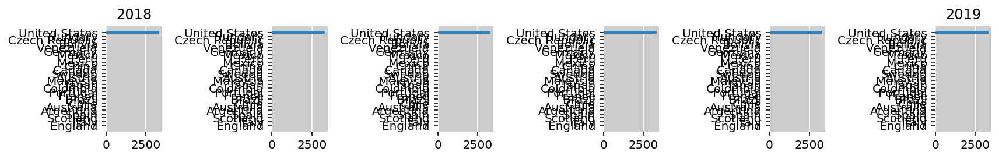

In [13]:
#Test first couple of images of dataseries
colors = plt.cm.tab20c(range(20))
labels = df_expanded.columns

def nice_axes(ax):
    ax.set_facecolor('.8')
#     ax.tick_params(labelsize=8, length=0)
    ax.grid(True, axis='x', color='white')
    ax.set_axisbelow(True)
    [spine.set_visible(False) for spine in ax.spines.values()]
    
fig, ax_array = plt.subplots(nrows=1, ncols=6, figsize=(12, 2), 
                             dpi=144, tight_layout=True)
labels = df_expanded.columns
for i, ax in enumerate(ax_array.flatten()):
    y = df_rank_expanded.iloc[i]
    width = df_expanded.iloc[i]
    ax.barh(y=y, width=width, color=colors, tick_label=labels)
    nice_axes(ax)
    

ax_array[0].set_title(2018)
ax_array[-1].set_title(2019);

In [14]:
colors = plt.cm.tab20c(range(20))
labels = df_expanded.columns

def init():
    ax.clear()
    nice_axes(ax)
    #ax.set_ylim(.2, 6.8)

def update(i):
    for bar in ax.containers:
        bar.remove()
    y = df_rank_expanded.iloc[i]
    width = df_expanded.iloc[i]
    ax.barh(y=y, width=width, color=colors, tick_label=labels)
    date_str = df_expanded.index[i].strftime('%Y')
    ax.set_title(f'Total Track Lengths - {date_str}', fontsize='smaller')
    
fig = plt.Figure(figsize=(4, 4), dpi=144)
ax = fig.add_subplot()

anim = FuncAnimation(fig=fig, func=update, init_func=init, frames=len(df_expanded), 
                     interval=75, repeat=False)

In [15]:
html = anim.to_html5_video()
HTML(html)

CalledProcessError: Command '['ffmpeg', '-f', 'rawvideo', '-vcodec', 'rawvideo', '-s', '576x576', '-pix_fmt', 'rgba', '-r', '13.333333333333334', '-loglevel', 'error', '-i', 'pipe:', '-vcodec', 'h264', '-pix_fmt', 'yuv420p', '-y', '/var/folders/cq/8x0tpjg547l4lq7x_q6n0gww0000gr/T/tmpcgzz68zs/temp.m4v']' returned non-zero exit status 255.

In [ ]:
anim.save('media/covid19.mp4')
